In [1]:
# Step 1: Import Libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity


In [2]:
# Step 2: Load Dataset
data = pd.read_csv("netflix_titles.csv")

<ipython-input-3-e3e78c5f18ca>:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data, x='type', palette='viridis')


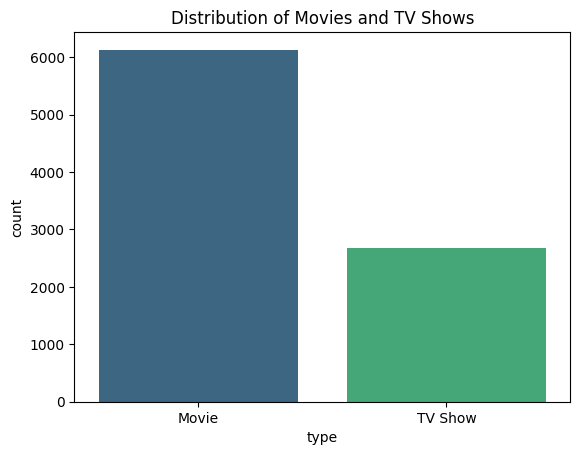

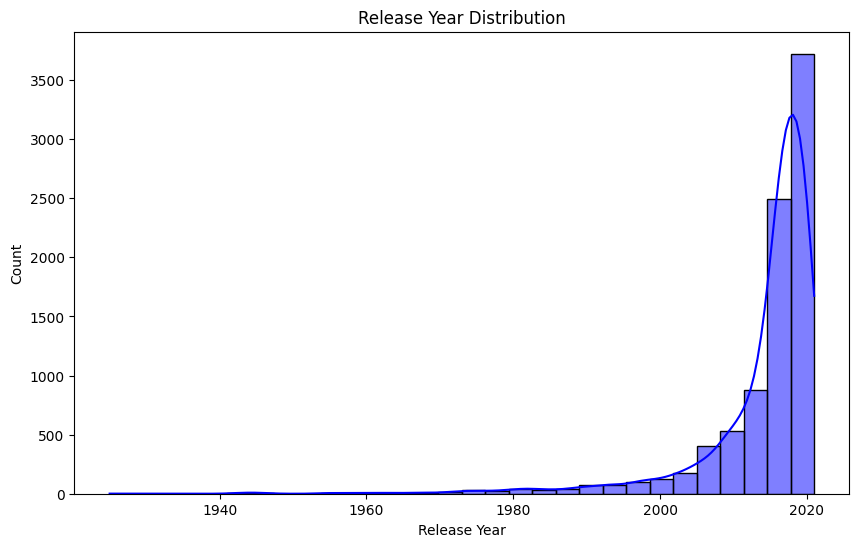

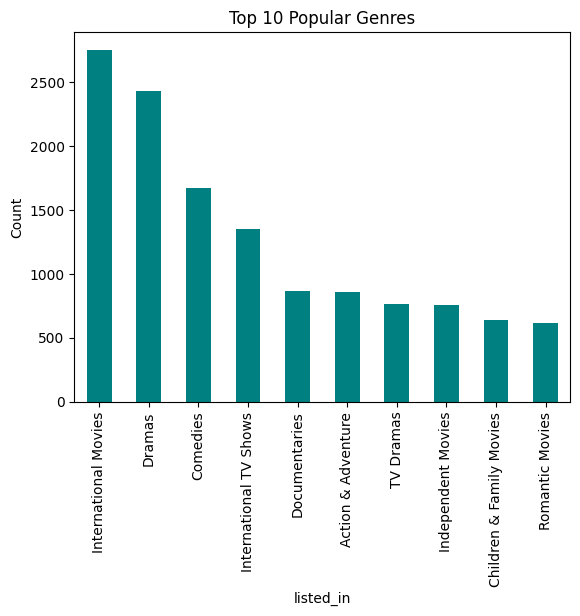

country
United States     2818
India              972
Unknown            831
United Kingdom     419
Japan              245
South Korea        200
Canada             181
Spain              145
France             124
Mexico             110
Name: count, dtype: int64


In [ ]:
# Standardize columns
columns_to_strip = ['title', 'director', 'cast', 'country', 'description']
for col in columns_to_strip:
    data[col] = data[col].str.strip()

# Step 4: EDA
# Movie vs TV Show Distribution
sns.countplot(data=data, x='type', palette='viridis')
plt.title('Distribution of Movies and TV Shows')
plt.show()

# Release Year Distribution
plt.figure(figsize=(10, 6))
sns.histplot(data['release_year'], bins=30, kde=True, color='blue')
plt.title('Release Year Distribution')
plt.xlabel('Release Year')
plt.ylabel('Count')
plt.show()

# Most Popular Genres
popular_genres = data['listed_in'].str.split(', ').explode().value_counts()[:10]
popular_genres.plot(kind='bar', color='teal')
plt.title('Top 10 Popular Genres')
plt.ylabel('Count')
plt.show()

# Step 5: Insights Generation
# Display top countries producing movies and TV shows
country_distribution = data['country'].value_counts()[:10]
print(country_distribution)

In [ ]:
# Step 6: Recommendation System
# Separate datasets for Movies and TV Shows
movies_data = data[data['type'] == 'Movie']
tvshows_data = data[data['type'] == 'TV Show']

# Content-Based Filtering for Movies
# Vectorize the 'description' field for Movies
vectorizer_movies = TfidfVectorizer(stop_words='english')
vectorized_desc_movies = vectorizer_movies.fit_transform(movies_data['description'])

# Compute similarity matrix for Movies
similarity_matrix_movies = cosine_similarity(vectorized_desc_movies)

# Content-Based Filtering for TV Shows
# Vectorize the 'description' field for TV Shows
vectorizer_tvshows = TfidfVectorizer(stop_words='english')
vectorized_desc_tvshows = vectorizer_tvshows.fit_transform(tvshows_data['description'])

# Compute similarity matrix for TV Shows
similarity_matrix_tvshows = cosine_similarity(vectorized_desc_tvshows)

In [ ]:

# Function for Movie Recommendations
def recommend_movies(title, data, similarity_matrix):
    idx = data[data['title'].str.lower() == title.lower()].index[0]
    similarity_scores = list(enumerate(similarity_matrix[idx]))
    similarity_scores = sorted(similarity_scores, key=lambda x: x[1], reverse=True)
    top_matches = similarity_scores[1:11]  # Top 10 recommendations excluding the title itself
    recommendations = data.iloc[[i[0] for i in top_matches]]
    return recommendations[['title', 'type', 'listed_in', 'description']]


In [ ]:
# Test Movie Recommendation System
print("Movie Recommendations for 'Dick Johnson Is Dead':")
print(recommend_movies("Dick Johnson Is Dead", movies_data, similarity_matrix_movies))

Movie Recommendations for 'Dick Johnson Is Dead':
                                        title   type  \
4877                                 End Game  Movie   
1066                                 The Soul  Movie   
7506                                     Moon  Movie   
5047                  The Cloverfield Paradox  Movie   
5233  The Death and Life of Marsha P. Johnson  Movie   
2674                                    Alelí  Movie   
6327                         Black Snake Moan  Movie   
4241                Secrets in the Hot Spring  Movie   
1731             A New York Christmas Wedding  Movie   
2380                             Riding Faith  Movie   

                                              listed_in  \
4877                                      Documentaries   
1066            Dramas, International Movies, Thrillers   
7506       Dramas, Independent Movies, Sci-Fi & Fantasy   
5047               Action & Adventure, Sci-Fi & Fantasy   
5233                        Documentar

In [ ]:
# Function for TV Show Recommendations
def recommend_tvshows(title, data, similarity_matrix):
    # Get the index based on the tvshows_data DataFrame, not the original data
    idx = data[data['title'].str.lower() == title.lower()].index[0]
    # Reset the index of tvshows_data to ensure it starts from 0
    data = data.reset_index(drop=True)  # Reset index and drop old index column
    # Now get the index based on the reset index
    idx = data[data['title'].str.lower() == title.lower()].index[0]
    similarity_scores = list(enumerate(similarity_matrix[idx]))
    similarity_scores = sorted(similarity_scores, key=lambda x: x[1], reverse=True)
    top_matches = similarity_scores[1:11]  # Top 10 recommendations excluding the title itself
    recommendations = data.iloc[[i[0] for i in top_matches]]
    return recommendations[['title', 'type', 'listed_in', 'description']]

In [ ]:

# Test TV Show Recommendation System
print("TV Show Recommendations for 'Stranger Things':")
print(recommend_tvshows("Stranger Things", tvshows_data, similarity_matrix_tvshows))

TV Show Recommendations for 'Stranger Things':
                         title     type  \
512            Sakho & Mangane  TV Show   
1538               Hardy Bucks  TV Show   
427   Sin senos sí hay paraíso  TV Show   
2532  Sin Senos sí Hay Paraíso  TV Show   
1778                   Requiem  TV Show   
2156            Bitter Daisies  TV Show   
1837               Broadchurch  TV Show   
1786                Collateral  TV Show   
1401               The Society  TV Show   
98               Gone for Good  TV Show   

                                              listed_in  \
512   Crime TV Shows, International TV Shows, TV Dramas   
1538                                        TV Comedies   
427   International TV Shows, Spanish-Language TV Sh...   
2532  International TV Shows, Spanish-Language TV Sh...   
1778  British TV Shows, International TV Shows, TV D...   
2156  Crime TV Shows, International TV Shows, TV Dramas   
1837  British TV Shows, Crime TV Shows, Internationa...   
1786  B

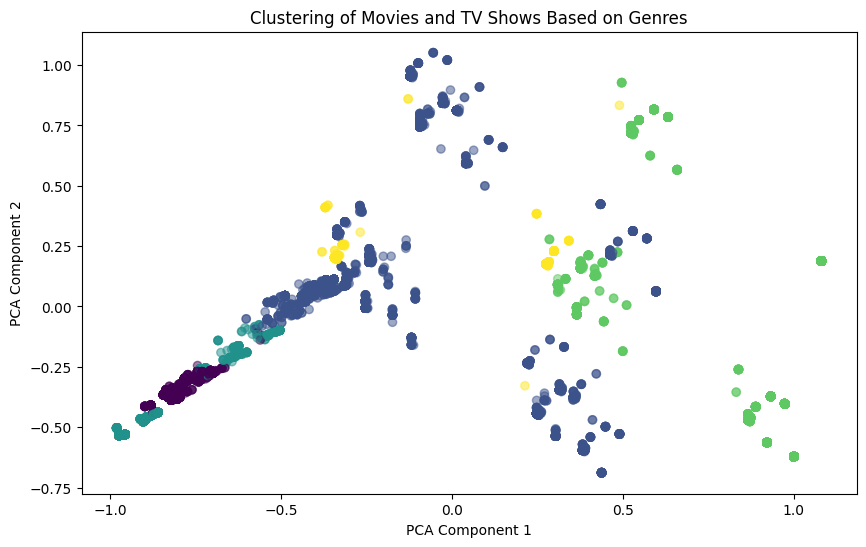

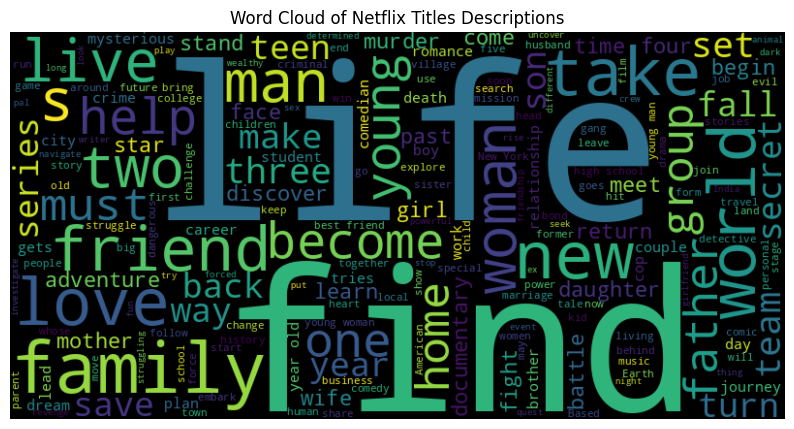

In [ ]:
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from wordcloud import WordCloud
# Step 7: Additional Creative Insights
# Clustering Based on Genres
all_genres = data['listed_in'].str.get_dummies(sep=', ')
kmeans = KMeans(n_clusters=5, random_state=42)
data['cluster'] = kmeans.fit_predict(all_genres)

# Visualizing Clusters Using PCA
pca = PCA(n_components=2)
genres_2d = pca.fit_transform(all_genres)
plt.figure(figsize=(10, 6))
plt.scatter(genres_2d[:, 0], genres_2d[:, 1], c=data['cluster'], cmap='viridis', alpha=0.5)
plt.title('Clustering of Movies and TV Shows Based on Genres')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.show()

# Word Cloud for Descriptions
text = " ".join(data['description'])
wordcloud = WordCloud(width=800, height=400, background_color='black').generate(text)
plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud of Netflix Titles Descriptions')
plt.show()

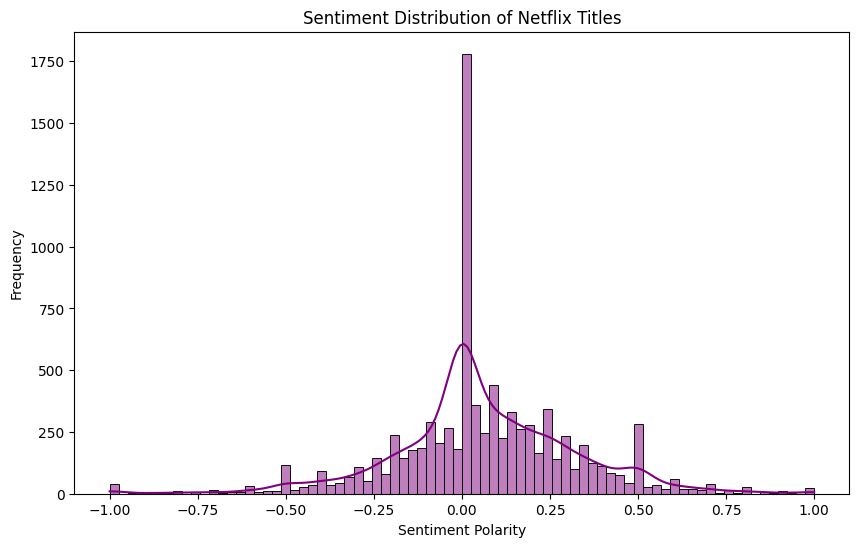

Most Positive Title:
title                                            Rock the Kasbah
description    When a has-been music producer gets stuck in A...
sentiment                                                    1.0
Name: 494, dtype: object

Most Negative Title:
title                                    Tobot Galaxy Detectives
description    An intergalactic device transforms toy cars in...
sentiment                                                   -1.0
Name: 100, dtype: object


In [ ]:
from textblob import TextBlob
# Sentiment Analysis on Descriptions
# Analyze sentiments of descriptions
sentiments = data['description'].apply(lambda x: TextBlob(x).sentiment.polarity)
data['sentiment'] = sentiments

# Visualize Sentiment Distribution
plt.figure(figsize=(10, 6))
sns.histplot(data['sentiment'], kde=True, color='purple')
plt.title('Sentiment Distribution of Netflix Titles')
plt.xlabel('Sentiment Polarity')
plt.ylabel('Frequency')
plt.show()

# Identifying Most Positive and Negative Titles
most_positive = data.loc[data['sentiment'].idxmax()]
most_negative = data.loc[data['sentiment'].idxmin()]

print("Most Positive Title:")
print(most_positive[['title', 'description', 'sentiment']])
print("\nMost Negative Title:")
print(most_negative[['title', 'description', 'sentiment']])

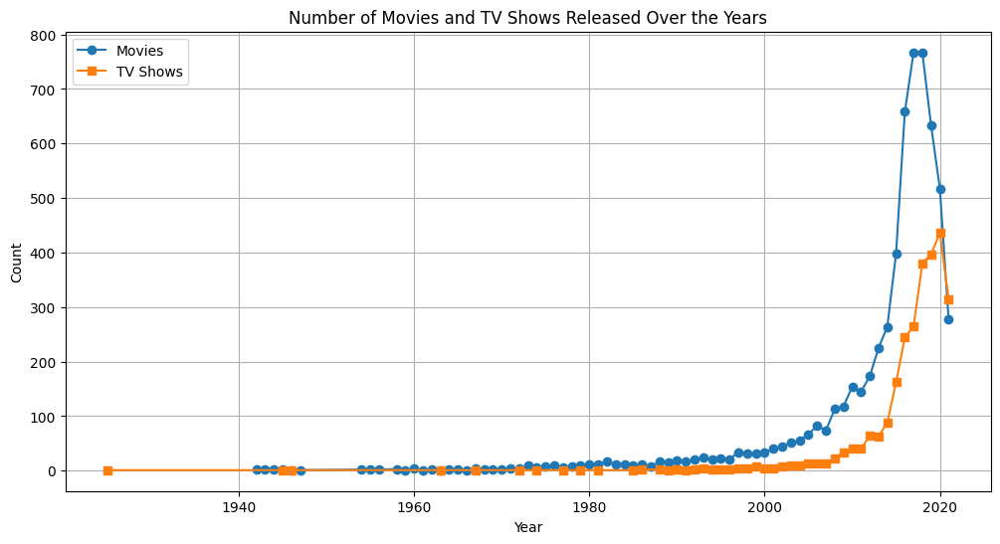

In [4]:
# Count the number of movies and TV shows per year
movies_per_year = data[data["type"] == "Movie"].groupby("release_year").size()
tv_shows_per_year = data[data["type"] == "TV Show"].groupby("release_year").size()

# Plot the data
plt.figure(figsize=(12, 6))
plt.plot(movies_per_year.index, movies_per_year.values, marker='o', label="Movies")
plt.plot(tv_shows_per_year.index, tv_shows_per_year.values, marker='s', label="TV Shows")
plt.xlabel("Year")
plt.ylabel("Count")
plt.title("Number of Movies and TV Shows Released Over the Years")
plt.legend()
plt.grid()
plt.show()


In [7]:
data["date_added"] = pd.to_datetime(data["date_added"], errors='coerce')
# Count the number of movies and TV shows per date added year
data["year_added"] = data["date_added"].dt.year
movies_per_added_year = data[data["type"] == "Movie"].groupby("year_added").size()
tv_shows_per_added_year = data[data["type"] == "TV Show"].groupby("year_added").size()

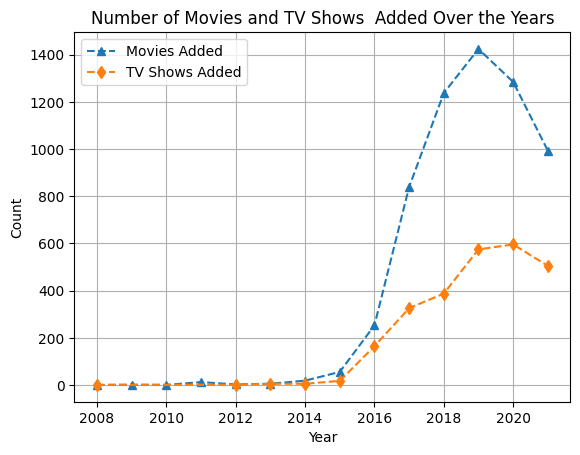

In [8]:
plt.plot(movies_per_added_year.index, movies_per_added_year.values, marker='^', linestyle='dashed', label="Movies Added")
plt.plot(tv_shows_per_added_year.index, tv_shows_per_added_year.values, marker='d', linestyle='dashed', label="TV Shows Added")
plt.xlabel("Year")
plt.ylabel("Count")
plt.title("Number of Movies and TV Shows  Added Over the Years")
plt.legend()
plt.grid()
plt.show()

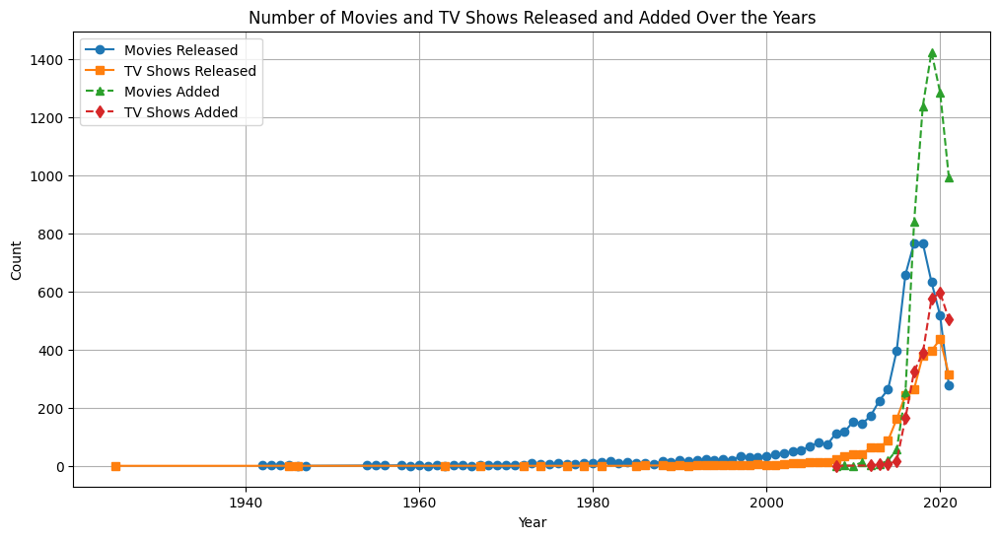

In [9]:
# Plot the data
plt.figure(figsize=(12, 6))
plt.plot(movies_per_year.index, movies_per_year.values, marker='o', label="Movies Released")
plt.plot(tv_shows_per_year.index, tv_shows_per_year.values, marker='s', label="TV Shows Released")
plt.plot(movies_per_added_year.index, movies_per_added_year.values, marker='^', linestyle='dashed', label="Movies Added")
plt.plot(tv_shows_per_added_year.index, tv_shows_per_added_year.values, marker='d', linestyle='dashed', label="TV Shows Added")
plt.xlabel("Year")
plt.ylabel("Count")
plt.title("Number of Movies and TV Shows Released and Added Over the Years")
plt.legend()
plt.grid()
plt.show()


In [11]:
# Average Duration of Movies Over the Years
# Extract numeric duration values and convert to minutes
data['duration_minutes'] = data['duration'].str.extract('(\d+)').astype(float)  # Extract numeric part

# Calculate the average duration using the numeric column
movies_duration = data[data["type"] == "Movie"].groupby("release_year")["duration_minutes"].mean()

# Continue with the rest of your analysis
# Most Frequent Movie and TV Show Directors
movie_directors = data[data["type"] == "Movie"]["director"].value_counts().head(10)
tv_show_directors = data[data["type"] == "TV Show"]["director"].value_counts().head(10)

# Seasonal Trends in Content Addition
data["month_added"] = data["date_added"].dt.month
seasonal_trends = data.groupby("month_added").size()

# Genre Evolution Over Time
genre_trends_movies = data[data["type"] == "Movie"].groupby(["release_year", "listed_in"]).size().unstack(fill_value=0)
genre_trends_tv = data[data["type"] == "TV Show"].groupby(["release_year", "listed_in"]).size().unstack(fill_value=0)

# Country-wise Movie and TV Show Releases Over Time
movies_by_country = data[data["type"] == "Movie"].groupby(["country", "release_year"]).size().unstack(fill_value=0)
tv_shows_by_country = data[data["type"] == "TV Show"].groupby(["country", "release_year"]).size().unstack(fill_value=0)
movies_added_by_country = data[data["type"] == "Movie"].groupby(["country", "year_added"]).size().unstack(fill_value=0)
tv_shows_added_by_country = data[data["type"] == "TV Show"].groupby(["country", "year_added"]).size().unstack(fill_value=0)

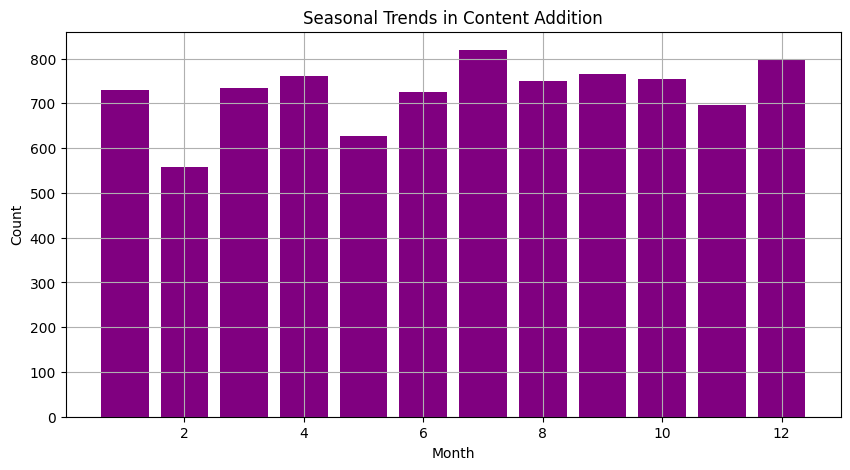

In [12]:
# Plot Seasonal Trends
plt.figure(figsize=(10, 5))
plt.bar(seasonal_trends.index, seasonal_trends.values, color='purple')
plt.xlabel("Month")
plt.ylabel("Count")
plt.title("Seasonal Trends in Content Addition")
plt.grid()
plt.show()

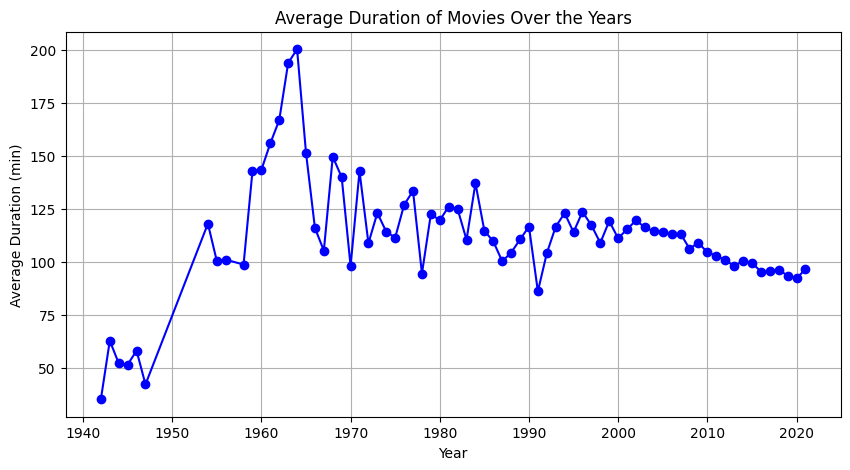

In [13]:
# Plot Average Duration of Movies Over the Years
plt.figure(figsize=(10, 5))
plt.plot(movies_duration.index, movies_duration.values, marker='o', color='blue')
plt.xlabel("Year")
plt.ylabel("Average Duration (min)")
plt.title("Average Duration of Movies Over the Years")
plt.grid()
plt.show()

<ipython-input-25-7b9b829a3c82>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  movies_data["duration"] = movies_data["duration"].str.replace(" min", "").astype(float)


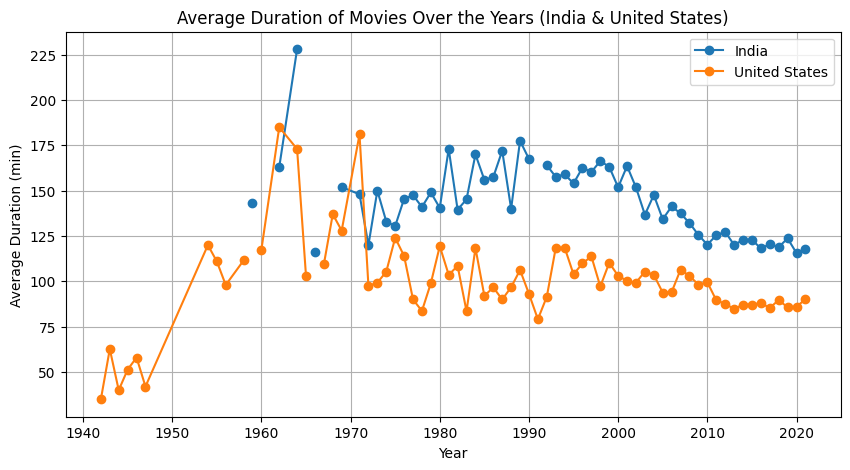

In [25]:
import pandas as pd
import matplotlib.pyplot as plt

# Filter data for Movies only
movies_data = data[data["type"] == "Movie"]

# Convert duration to numeric (assuming format like "120 min")
movies_data["duration"] = movies_data["duration"].str.replace(" min", "").astype(float)

# Filter only India and United States
selected_countries = ["India", "United States"]
movies_filtered = movies_data[movies_data["country"].isin(selected_countries)]

# Compute average duration per year for each country
movies_duration = movies_filtered.groupby(["country", "release_year"])["duration"].mean().unstack()

# Plot data for India and the United States
plt.figure(figsize=(10, 5))
for country in selected_countries:
    plt.plot(movies_duration.columns, movies_duration.loc[country], marker='o', label=country)

plt.xlabel("Year")
plt.ylabel("Average Duration (min)")
plt.title("Average Duration of Movies Over the Years (India & United States)")
plt.legend()
plt.grid()
plt.show()


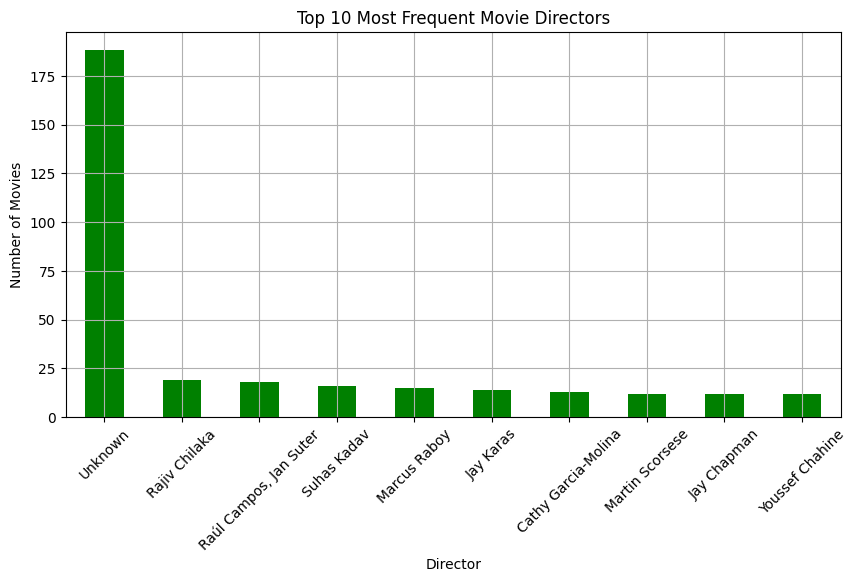

In [14]:
# Plot Most Frequent Movie Directors
movie_directors.plot(kind='bar', figsize=(10, 5), color='green')
plt.xlabel("Director")
plt.ylabel("Number of Movies")
plt.title("Top 10 Most Frequent Movie Directors")
plt.xticks(rotation=45)
plt.grid()
plt.show()

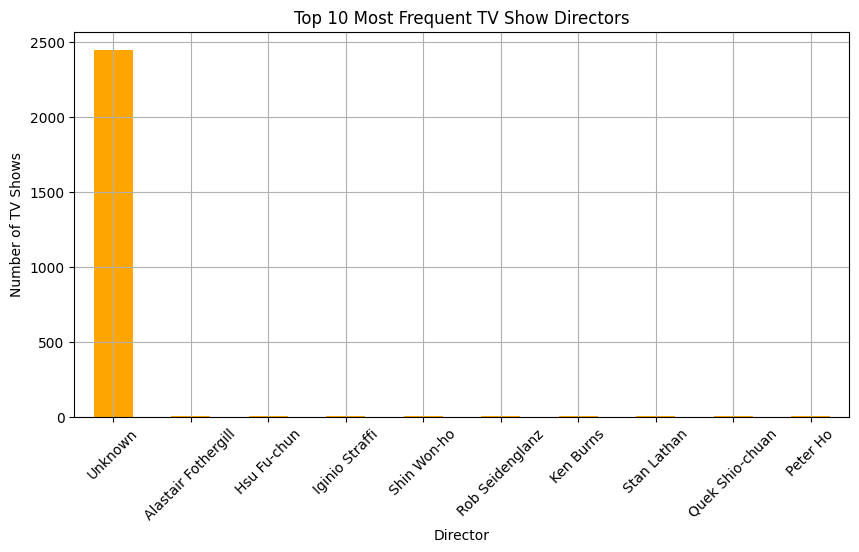

In [15]:

# Plot Most Frequent TV Show Directors
tv_show_directors.plot(kind='bar', figsize=(10, 5), color='orange')
plt.xlabel("Director")
plt.ylabel("Number of TV Shows")
plt.title("Top 10 Most Frequent TV Show Directors")
plt.xticks(rotation=45)
plt.grid()
plt.show()

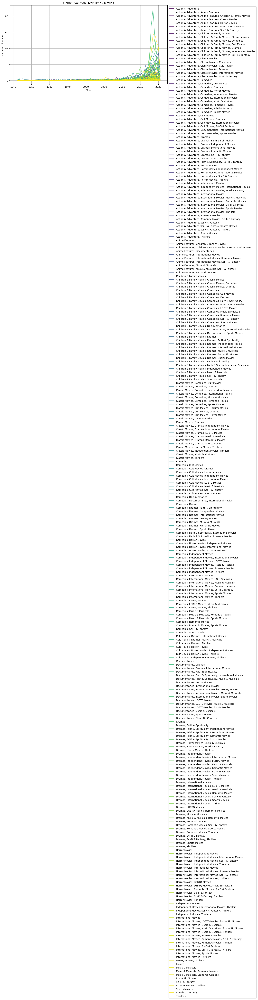

In [16]:
# Plot Genre Evolution Over Time
genre_trends_movies.plot(figsize=(12, 6), colormap='viridis', alpha=0.75)
plt.xlabel("Year")
plt.ylabel("Number of Movies")
plt.title("Genre Evolution Over Time - Movies")
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
plt.grid()
plt.show()

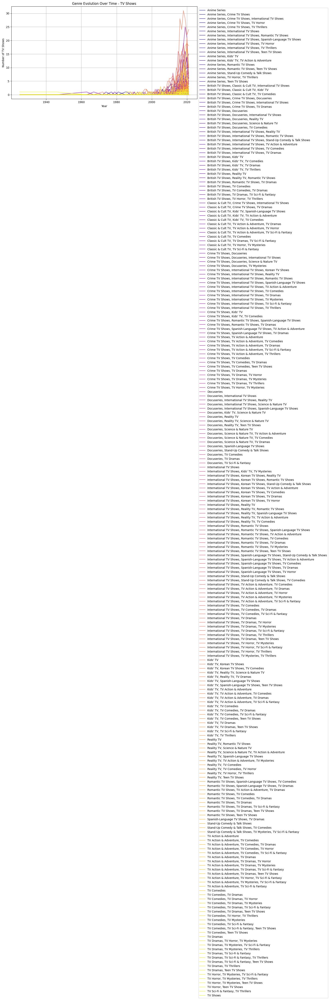

In [17]:
genre_trends_tv.plot(figsize=(12, 6), colormap='plasma', alpha=0.75)
plt.xlabel("Year")
plt.ylabel("Number of TV Shows")
plt.title("Genre Evolution Over Time - TV Shows")
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
plt.grid()
plt.show()

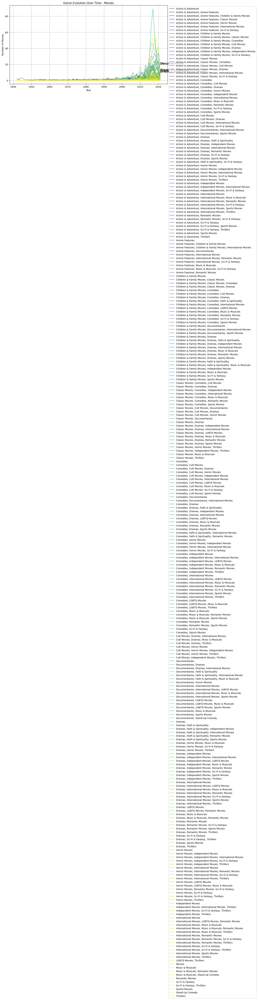

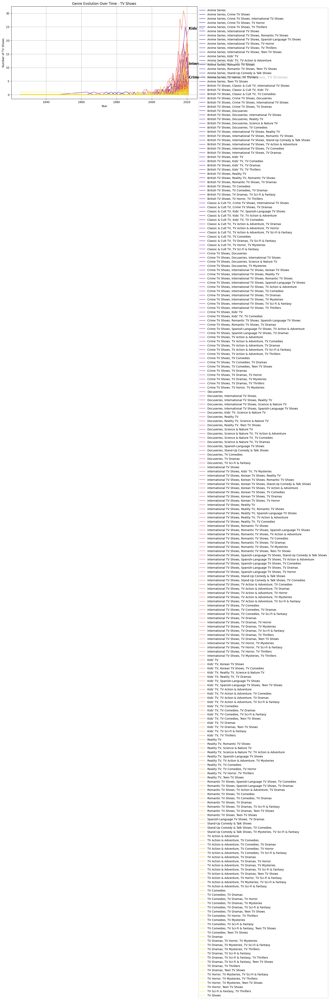

In [19]:
# Get top 3 genres for movies
top_movie_genres = genre_trends_movies.sum().nlargest(3).index
# Get top 3 genres for TV shows
top_tv_genres = genre_trends_tv.sum().nlargest(3).index

# Plot Genre Evolution Over Time
ax = genre_trends_movies.plot(figsize=(12, 6), colormap='viridis', alpha=0.75)
plt.xlabel("Year")
plt.ylabel("Number of Movies")
plt.title("Genre Evolution Over Time - Movies")
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
plt.grid()
# Annotate top genres
for i, genre in enumerate(top_movie_genres):
    plt.text(genre_trends_movies.index[-1], genre_trends_movies[genre].iloc[-1], genre, fontsize=12, fontweight='bold', color='black')
plt.show()

ax = genre_trends_tv.plot(figsize=(12, 6), colormap='plasma', alpha=0.75)
plt.xlabel("Year")
plt.ylabel("Number of TV Shows")
plt.title("Genre Evolution Over Time - TV Shows")
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
plt.grid()
# Annotate top genres
for i, genre in enumerate(top_tv_genres):
    plt.text(genre_trends_tv.index[-1], genre_trends_tv[genre].iloc[-1], genre, fontsize=12, fontweight='bold', color='black')
plt.show()


In [20]:
# Seasonal Trends in Content Addition
data["month_added"] = data["date_added"].dt.month
movies_seasonal_trends = data[data["type"] == "Movie"].groupby("month_added").size()
tv_shows_seasonal_trends = data[data["type"] == "TV Show"].groupby("month_added").size()

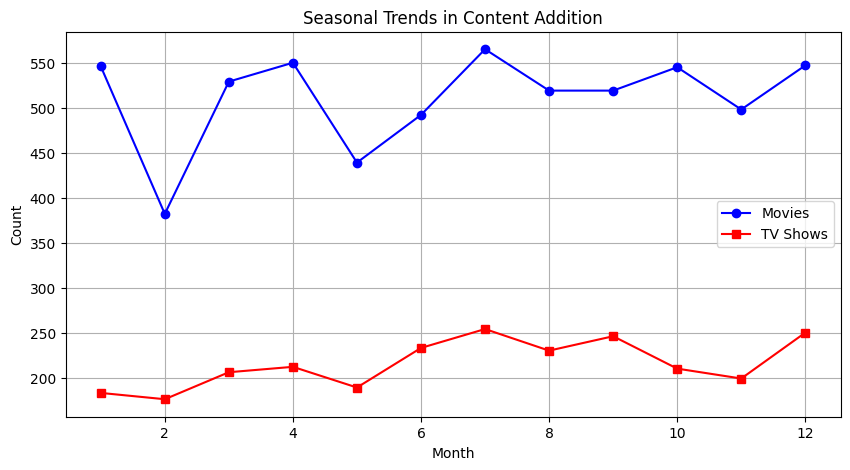

In [21]:
# Plot Seasonal Trends in Content Addition
plt.figure(figsize=(10, 5))
plt.plot(movies_seasonal_trends.index, movies_seasonal_trends.values, marker='o', linestyle='-', color='blue', label="Movies")
plt.plot(tv_shows_seasonal_trends.index, tv_shows_seasonal_trends.values, marker='s', linestyle='-', color='red', label="TV Shows")
plt.xlabel("Month")
plt.ylabel("Count")
plt.title("Seasonal Trends in Content Addition")
plt.legend()
plt.grid()
plt.show()

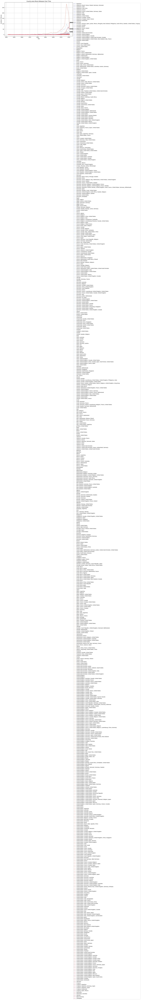

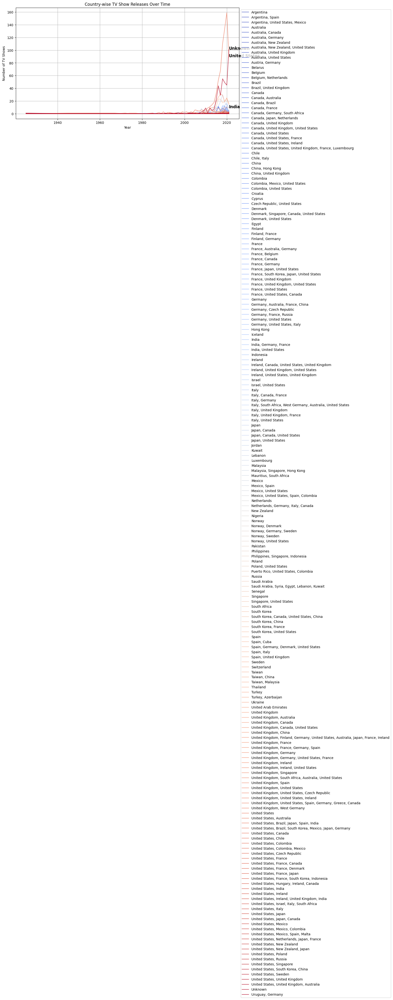

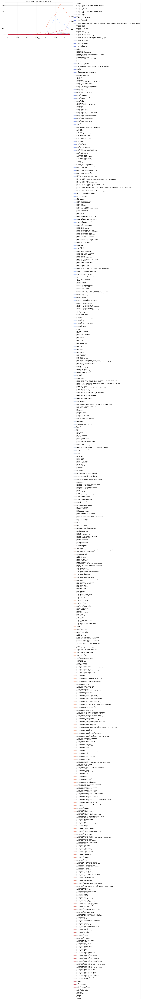

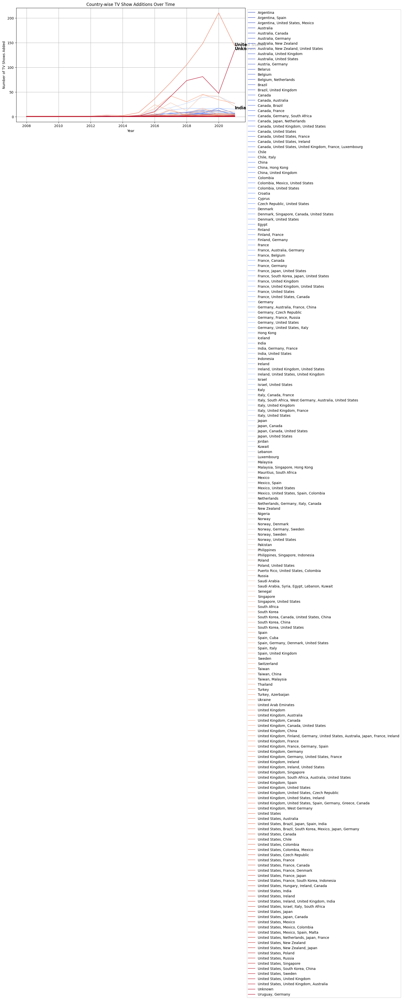

In [23]:
# Get top 3 countries
top_countries = movies_by_country.sum(axis=1).nlargest(3).index

# Plot Country-wise Movie Releases Over Time
ax = movies_by_country.T.plot(figsize=(12, 6), colormap='coolwarm', alpha=0.75)
plt.xlabel("Year")
plt.ylabel("Number of Movies")
plt.title("Country-wise Movie Releases Over Time")
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
plt.grid()
for country in top_countries:
    plt.text(movies_by_country.columns[-1], movies_by_country.loc[country].iloc[-1], country, fontsize=12, fontweight='bold')
plt.show()

# Plot Country-wise TV Show Releases Over Time
ax = tv_shows_by_country.T.plot(figsize=(12, 6), colormap='coolwarm', alpha=0.75)
plt.xlabel("Year")
plt.ylabel("Number of TV Shows")
plt.title("Country-wise TV Show Releases Over Time")
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
plt.grid()
for country in top_countries:
    plt.text(tv_shows_by_country.columns[-1], tv_shows_by_country.loc[country].iloc[-1], country, fontsize=12, fontweight='bold')
plt.show()

# Plot Country-wise Movie Additions Over Time
ax = movies_added_by_country.T.plot(figsize=(12, 6), colormap='coolwarm', alpha=0.75)
plt.xlabel("Year")
plt.ylabel("Number of Movies Added")
plt.title("Country-wise Movie Additions Over Time")
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
plt.grid()
for country in top_countries:
    plt.text(movies_added_by_country.columns[-1], movies_added_by_country.loc[country].iloc[-1], country, fontsize=12, fontweight='bold')
plt.show()

# Plot Country-wise TV Show Additions Over Time
ax = tv_shows_added_by_country.T.plot(figsize=(12, 6), colormap='coolwarm', alpha=0.75)
plt.xlabel("Year")
plt.ylabel("Number of TV Shows Added")
plt.title("Country-wise TV Show Additions Over Time")
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
plt.grid()
for country in top_countries:
    plt.text(tv_shows_added_by_country.columns[-1], tv_shows_added_by_country.loc[country].iloc[-1], country, fontsize=12, fontweight='bold')
plt.show()


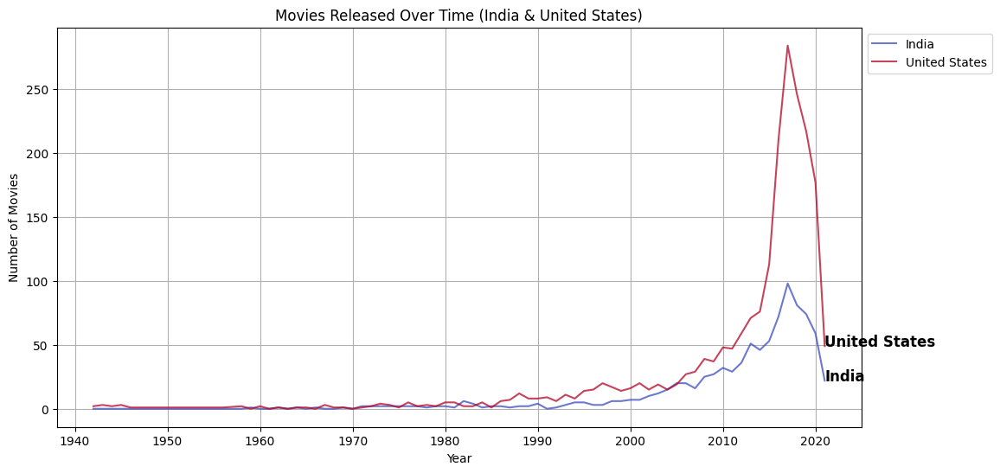

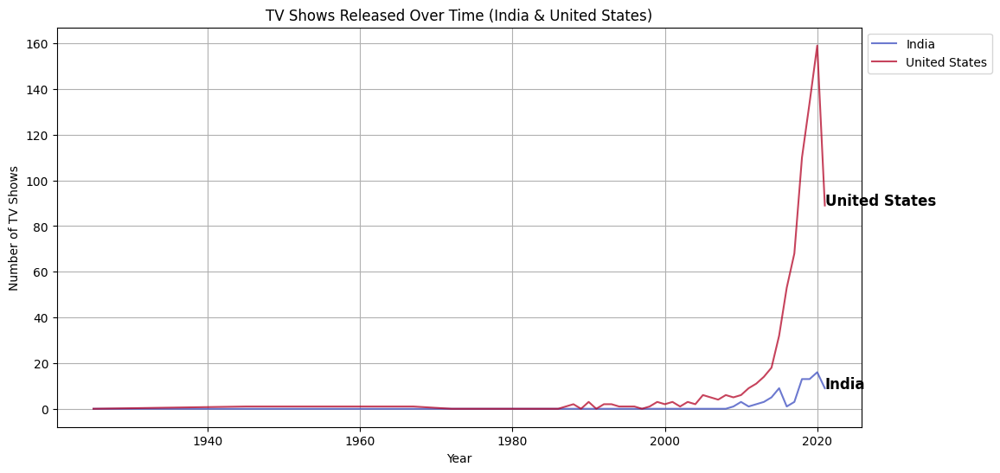

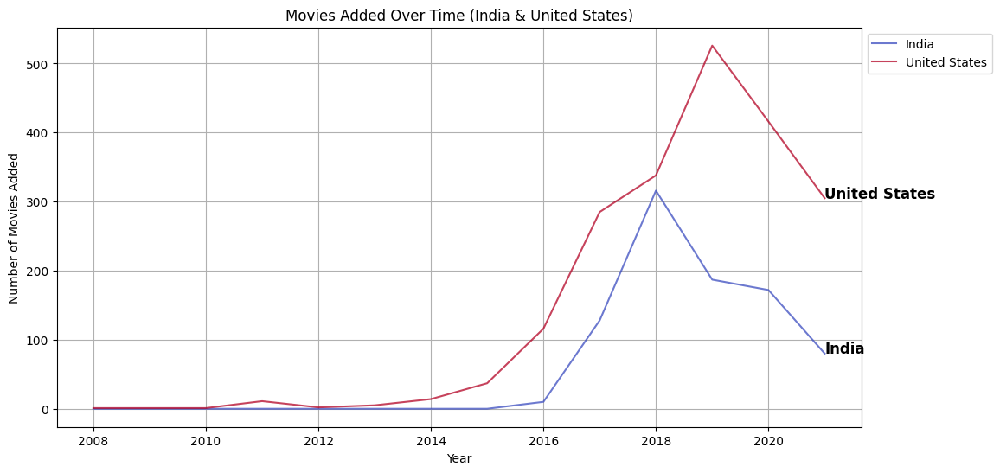

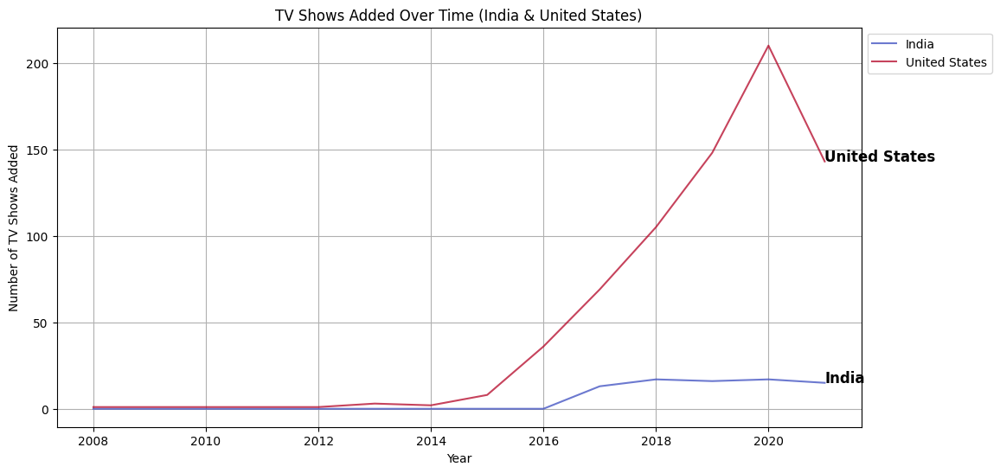

In [24]:
import pandas as pd
import matplotlib.pyplot as plt

# Filter data for Movies and TV Shows by country and year
movies_by_country = data[data["type"] == "Movie"].groupby(["country", "release_year"]).size().unstack(fill_value=0)
tv_shows_by_country = data[data["type"] == "TV Show"].groupby(["country", "release_year"]).size().unstack(fill_value=0)
movies_added_by_country = data[data["type"] == "Movie"].groupby(["country", "year_added"]).size().unstack(fill_value=0)
tv_shows_added_by_country = data[data["type"] == "TV Show"].groupby(["country", "year_added"]).size().unstack(fill_value=0)

# Filter for only India and United States
selected_countries = ["India", "United States"]
movies_by_country = movies_by_country.loc[selected_countries]
tv_shows_by_country = tv_shows_by_country.loc[selected_countries]
movies_added_by_country = movies_added_by_country.loc[selected_countries]
tv_shows_added_by_country = tv_shows_added_by_country.loc[selected_countries]

# Function to plot data
def plot_data(data, title, ylabel):
    ax = data.T.plot(figsize=(12, 6), colormap='coolwarm', alpha=0.75)
    plt.xlabel("Year")
    plt.ylabel(ylabel)
    plt.title(title)
    plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
    plt.grid()
    for country in selected_countries:
        plt.text(data.columns[-1], data.loc[country].iloc[-1], country, fontsize=12, fontweight='bold')
    plt.show()

# Plot for Movies Released
plot_data(movies_by_country, "Movies Released Over Time (India & United States)", "Number of Movies")

# Plot for TV Shows Released
plot_data(tv_shows_by_country, "TV Shows Released Over Time (India & United States)", "Number of TV Shows")

# Plot for Movies Added Over Time
plot_data(movies_added_by_country, "Movies Added Over Time (India & United States)", "Number of Movies Added")

# Plot for TV Shows Added Over Time
plot_data(tv_shows_added_by_country, "TV Shows Added Over Time (India & United States)", "Number of TV Shows Added")


In [26]:
import pandas as pd

# Extract and split cast members
cast_series = data["cast"].dropna().str.split(", ").explode()

# Count occurrences of each cast member and get the top 10
top_cast_members = cast_series.value_counts().head(10)

# Display the top 10 cast members
print("Top 10 Most Frequent Cast Members:")
print(top_cast_members)


Top 10 Most Frequent Cast Members:
cast
Unknown             825
Anupam Kher          43
Shah Rukh Khan       35
Julie Tejwani        33
Naseeruddin Shah     32
Takahiro Sakurai     32
Rupa Bhimani         31
Akshay Kumar         30
Om Puri              30
Yuki Kaji            29
Name: count, dtype: int64


Top 10 Most Frequent Cast Members:
cast
Anupam Kher         43
Shah Rukh Khan      35
Julie Tejwani       33
Naseeruddin Shah    32
Takahiro Sakurai    32
Rupa Bhimani        31
Akshay Kumar        30
Om Puri             30
Yuki Kaji           29
Paresh Rawal        28
Name: count, dtype: int64


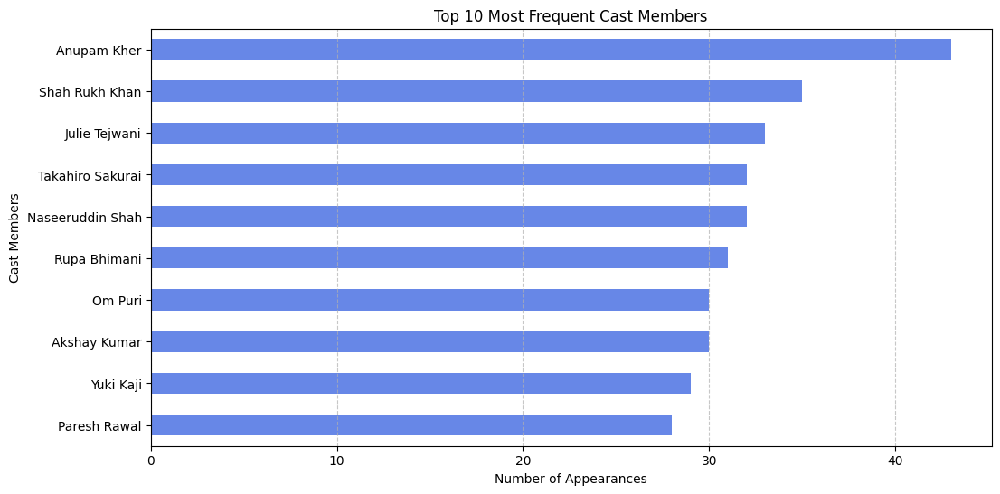

In [27]:
import pandas as pd
import matplotlib.pyplot as plt

# Extract and clean cast members
cast_series = data["cast"].dropna().str.split(", ").explode()

# Remove unknown or empty values
cast_series = cast_series[cast_series.str.lower() != "unknown"]

# Count occurrences of each cast member and get the top 10
top_cast_members = cast_series.value_counts().head(10)

# Display the top 10 most frequent cast members
print("Top 10 Most Frequent Cast Members:")
print(top_cast_members)

# Plot the top 10 cast members
plt.figure(figsize=(12, 6))
top_cast_members.sort_values().plot(kind='barh', color='royalblue', alpha=0.8)
plt.xlabel("Number of Appearances")
plt.ylabel("Cast Members")
plt.title("Top 10 Most Frequent Cast Members")
plt.grid(axis='x', linestyle="--", alpha=0.7)
plt.show()


Top 10 Most Frequent Movie Cast Members:
cast
Anupam Kher         42
Shah Rukh Khan      35
Naseeruddin Shah    32
Akshay Kumar        30
Om Puri             30
Amitabh Bachchan    28
Julie Tejwani       28
Paresh Rawal        28
Rupa Bhimani        27
Boman Irani         27
Name: count, dtype: int64

Top 10 Most Frequent TV Show Cast Members:
cast
Takahiro Sakurai      25
Yuki Kaji             19
Daisuke Ono           17
Junichi Suwabe        17
Ai Kayano             17
Yuichi Nakamura       16
Jun Fukuyama          15
Yoshimasa Hosoya      15
David Attenborough    14
Mamoru Miyano         13
Name: count, dtype: int64


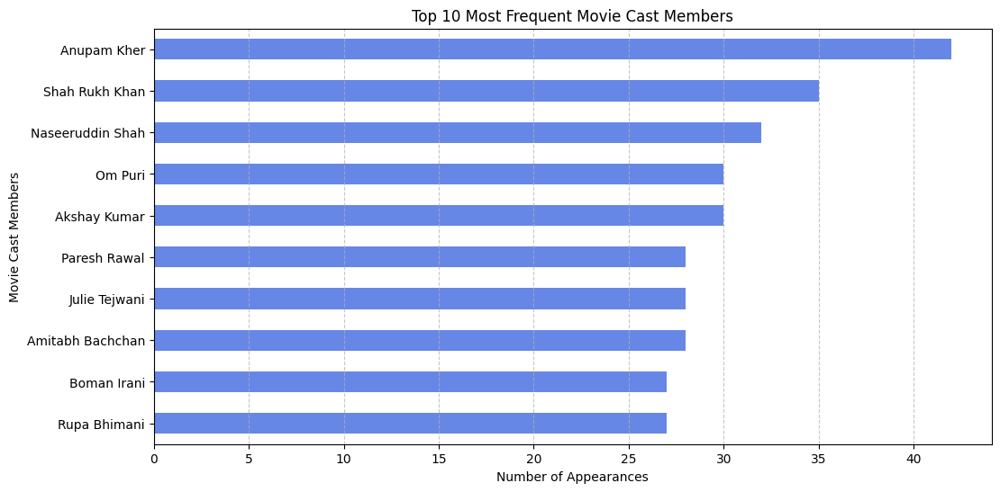

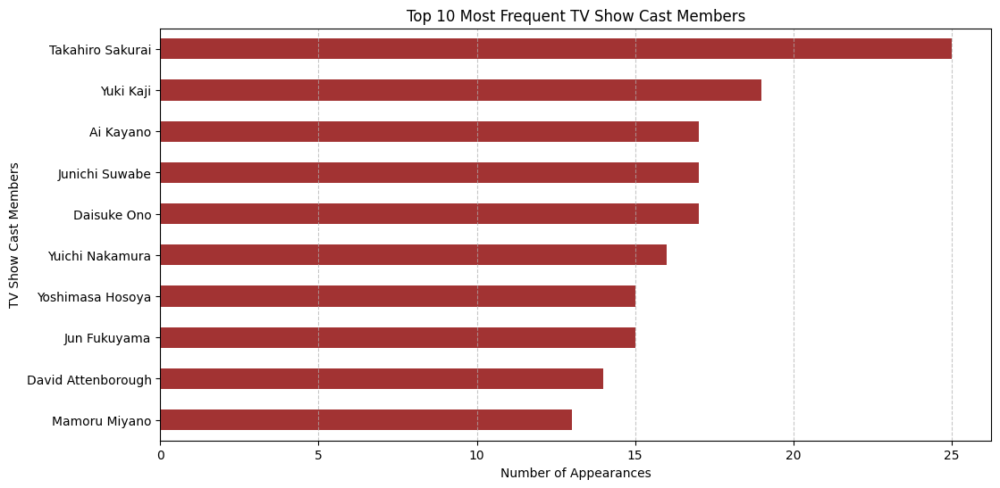

In [28]:
import pandas as pd
import matplotlib.pyplot as plt

# Extract and clean cast members for Movies
movies_cast_series = data[data["type"] == "Movie"]["cast"].dropna().str.split(", ").explode()
movies_cast_series = movies_cast_series[movies_cast_series.str.lower() != "unknown"]
top_movies_cast = movies_cast_series.value_counts().head(10)

# Extract and clean cast members for TV Shows
tv_cast_series = data[data["type"] == "TV Show"]["cast"].dropna().str.split(", ").explode()
tv_cast_series = tv_cast_series[tv_cast_series.str.lower() != "unknown"]
top_tv_cast = tv_cast_series.value_counts().head(10)

# Display the top 10 most frequent cast members
print("Top 10 Most Frequent Movie Cast Members:")
print(top_movies_cast)

print("\nTop 10 Most Frequent TV Show Cast Members:")
print(top_tv_cast)

# Plot the top 10 cast members for Movies
plt.figure(figsize=(12, 6))
top_movies_cast.sort_values().plot(kind='barh', color='royalblue', alpha=0.8)
plt.xlabel("Number of Appearances")
plt.ylabel("Movie Cast Members")
plt.title("Top 10 Most Frequent Movie Cast Members")
plt.grid(axis='x', linestyle="--", alpha=0.7)
plt.show()

# Plot the top 10 cast members for TV Shows
plt.figure(figsize=(12, 6))
top_tv_cast.sort_values().plot(kind='barh', color='darkred', alpha=0.8)
plt.xlabel("Number of Appearances")
plt.ylabel("TV Show Cast Members")
plt.title("Top 10 Most Frequent TV Show Cast Members")
plt.grid(axis='x', linestyle="--", alpha=0.7)
plt.show()


Top 20 TV Shows with the Most Seasons:
                                   title  seasons
548                       Grey's Anatomy     17.0
2423                        Supernatural     15.0
4798                                NCIS     15.0
1354                           Heartland     13.0
4220              COMEDIANS of the world     13.0
7847                        Red vs. Blue     13.0
4964                   Trailer Park Boys     12.0
5412                      Criminal Minds     12.0
6456                              Cheers     11.0
6795                             Frasier     11.0
390                     The Walking Dead     10.0
1622                       Stargate SG-1     10.0
1759  LEGO Ninjago: Masters of Spinjitzu     10.0
2203                    Shameless (U.S.)     10.0
5908    Danger Mouse: Classic Collection     10.0
6549                          Dad's Army     10.0
6806                             Friends     10.0
8          The Great British Baking Show      9.0
67         

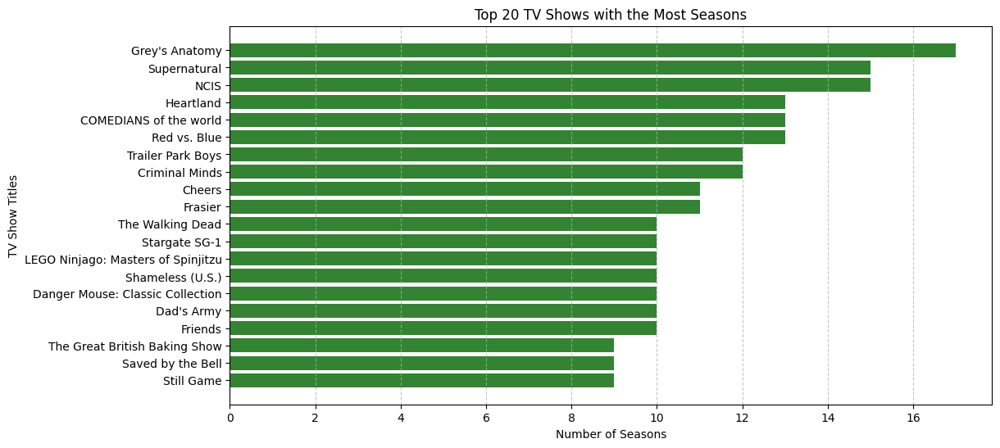

In [30]:
import pandas as pd
import matplotlib.pyplot as plt

# Filter data for TV Shows
tv_shows = data[data["type"] == "TV Show"].copy()

# Extract number of seasons (convert "X Seasons" or "1 Season" to numeric)
tv_shows["seasons"] = tv_shows["duration"].str.extract(r'(\d+)').astype(float)

# Find TV shows with the most seasons
top_tv_shows = tv_shows.nlargest(20, "seasons")[["title", "seasons"]]

# Display the top 20 TV shows with the most seasons
print("Top 20 TV Shows with the Most Seasons:")
print(top_tv_shows)

# Plot the top 20 TV shows with the most seasons
plt.figure(figsize=(12, 6))
plt.barh(top_tv_shows["title"], top_tv_shows["seasons"], color='darkgreen', alpha=0.8)
plt.xlabel("Number of Seasons")
plt.ylabel("TV Show Titles")
plt.title("Top 20 TV Shows with the Most Seasons")
plt.gca().invert_yaxis()  # Invert y-axis for better readability
plt.grid(axis='x', linestyle="--", alpha=0.7)
plt.show()


Movie Rating Distribution:
rating
TV-MA       2062
TV-14       1427
R            797
TV-PG        540
PG-13        490
PG           287
TV-Y7        139
TV-Y         131
TV-G         126
NR            75
G             41
TV-Y7-FV       5
NC-17          3
UR             3
74 min         1
84 min         1
66 min         1
Name: count, dtype: int64

TV Show Rating Distribution:
rating
TV-MA       1145
TV-14        733
TV-PG        323
TV-Y7        195
TV-Y         176
TV-G          94
NR             5
R              2
TV-Y7-FV       1
Name: count, dtype: int64


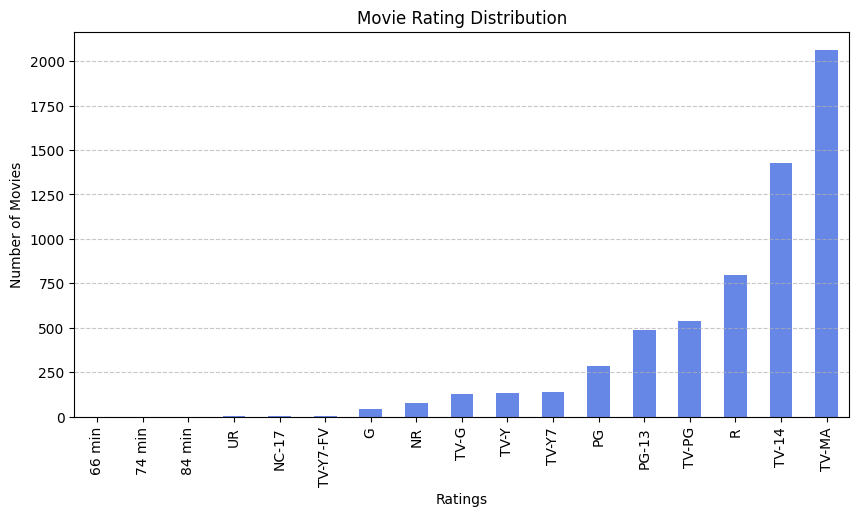

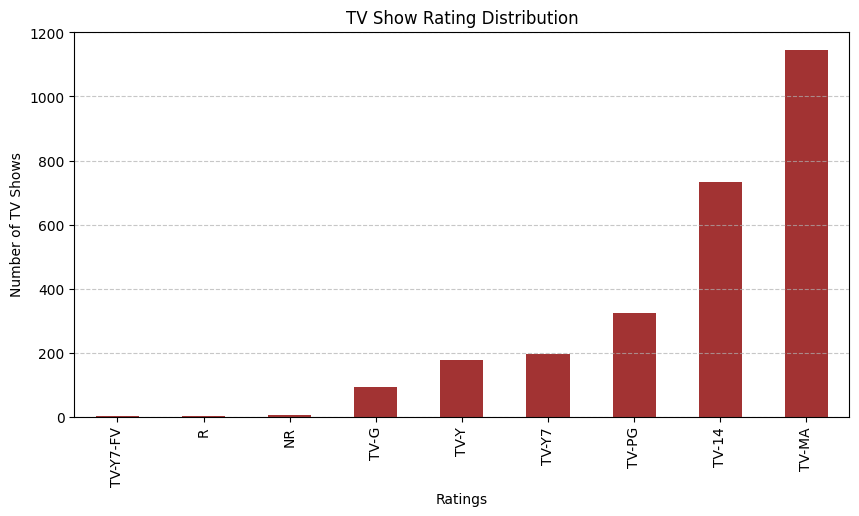

In [31]:
import pandas as pd
import matplotlib.pyplot as plt

# Filter and count ratings separately for Movies & TV Shows
movies_ratings = data[data["type"] == "Movie"]["rating"].value_counts()
tv_shows_ratings = data[data["type"] == "TV Show"]["rating"].value_counts()

# Display the rating distribution
print("Movie Rating Distribution:")
print(movies_ratings)

print("\nTV Show Rating Distribution:")
print(tv_shows_ratings)

# Plot Movie Rating Distribution
plt.figure(figsize=(10, 5))
movies_ratings.sort_values().plot(kind='bar', color='royalblue', alpha=0.8)
plt.xlabel("Ratings")
plt.ylabel("Number of Movies")
plt.title("Movie Rating Distribution")
plt.grid(axis='y', linestyle="--", alpha=0.7)
plt.show()

# Plot TV Show Rating Distribution
plt.figure(figsize=(10, 5))
tv_shows_ratings.sort_values().plot(kind='bar', color='darkred', alpha=0.8)
plt.xlabel("Ratings")
plt.ylabel("Number of TV Shows")
plt.title("TV Show Rating Distribution")
plt.grid(axis='y', linestyle="--", alpha=0.7)
plt.show()


Movie Genre Distribution:
listed_in
International Movies        2752
Dramas                      2427
Comedies                    1674
Documentaries                869
Action & Adventure           859
Independent Movies           756
Children & Family Movies     641
Romantic Movies              616
Thrillers                    577
Music & Musicals             375
Horror Movies                357
Stand-Up Comedy              343
Sci-Fi & Fantasy             243
Sports Movies                219
Classic Movies               116
LGBTQ Movies                 102
Anime Features                71
Cult Movies                   71
Faith & Spirituality          65
Movies                        57
Name: count, dtype: int64

TV Show Genre Distribution:
listed_in
International TV Shows          1351
TV Dramas                        763
TV Comedies                      581
Crime TV Shows                   470
Kids' TV                         451
Docuseries                       395
Romantic TV Shows

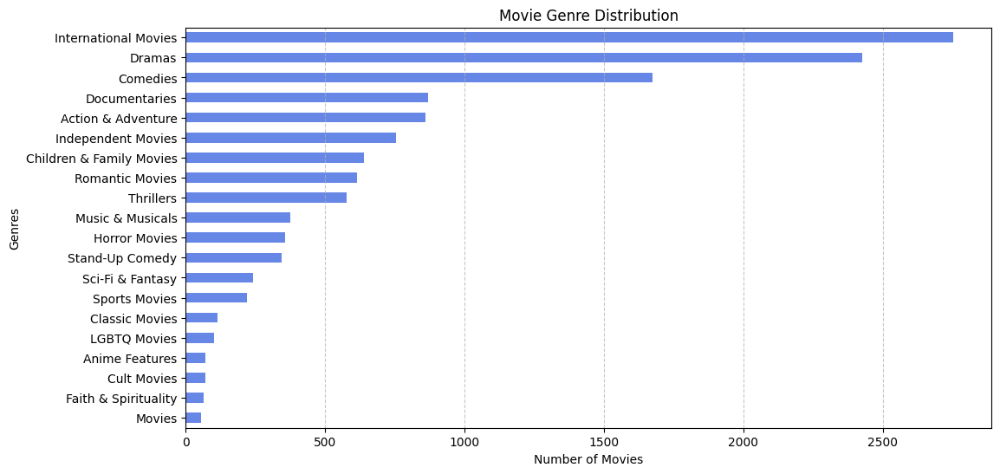

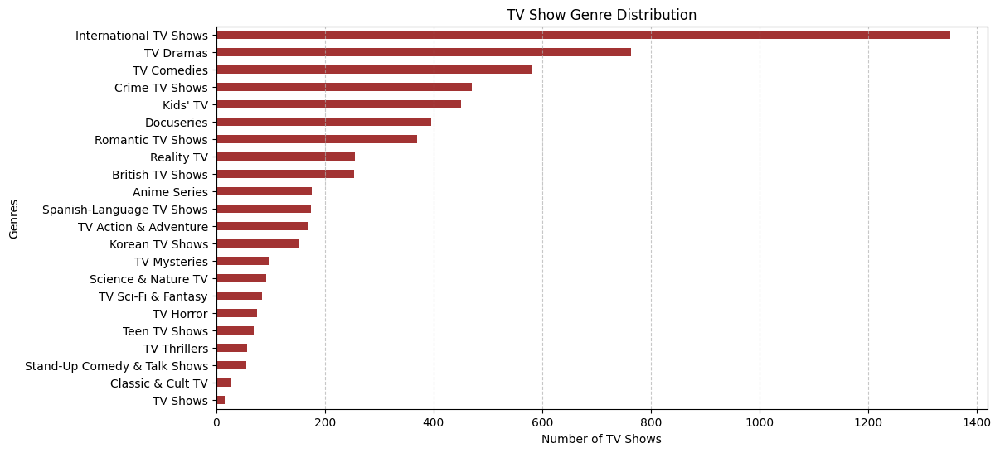

In [32]:
import pandas as pd
import matplotlib.pyplot as plt

# Filter and extract genres separately for Movies & TV Shows
movies_genres = data[data["type"] == "Movie"]["listed_in"].dropna().str.split(", ").explode()
tv_shows_genres = data[data["type"] == "TV Show"]["listed_in"].dropna().str.split(", ").explode()

# Count the occurrences of each genre
movies_genre_counts = movies_genres.value_counts()
tv_shows_genre_counts = tv_shows_genres.value_counts()

# Display the genre distribution
print("Movie Genre Distribution:")
print(movies_genre_counts)

print("\nTV Show Genre Distribution:")
print(tv_shows_genre_counts)

# Plot Movie Genre Distribution
plt.figure(figsize=(12, 6))
movies_genre_counts.sort_values().plot(kind='barh', color='royalblue', alpha=0.8)
plt.xlabel("Number of Movies")
plt.ylabel("Genres")
plt.title("Movie Genre Distribution")
plt.grid(axis='x', linestyle="--", alpha=0.7)
plt.show()

# Plot TV Show Genre Distribution
plt.figure(figsize=(12, 6))
tv_shows_genre_counts.sort_values().plot(kind='barh', color='darkred', alpha=0.8)
plt.xlabel("Number of TV Shows")
plt.ylabel("Genres")
plt.title("TV Show Genre Distribution")
plt.grid(axis='x', linestyle="--", alpha=0.7)
plt.show()
